<a href="https://colab.research.google.com/github/easyri/paintings-and-stuff/blob/master/attention_training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import PIL
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from matplotlib.ticker import MaxNLocator

import pandas as pd
import requests
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import os, glob, cv2

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

from keras.applications.inception_resnet_v2 import preprocess_input
from keras.applications import InceptionResNetV2
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Model
from keras.preprocessing import image
from keras.layers import Flatten, Input,Reshape, Concatenate
from keras.models import load_model
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array


import argparse
import os
from os import listdir
import time
import random
import glob
import copy
import shutil
import sys
import string
from pickle import dump
from sklearn.model_selection import train_test_split
from pickle import load
from nltk.translate.bleu_score import sentence_bleu

In [9]:

# load doc into memory
def load_doc(filename):
  # open the file as read only
  file = open(filename, 'r')
  # read all text
  text = file.read()
  # close the file
  file.close()
  return text


# extract descriptions for images
def load_descriptions(doc):
  mapping = dict()
  # process lines
  for line in doc.split('\n'):
    # split line by white space
    tokens = line.split()
    if len(line) < 2:
      continue
    # take the first token as the image id, the rest as the description
    image_id, image_desc = tokens[0], tokens[1:]
    # remove filename from image id
    image_id = image_id.split('.')[0]
    # convert description tokens back to string
    image_desc = ' '.join(image_desc)
    # create the list if needed
    if image_id not in mapping:
      mapping[image_id] = list()
    # store description
    mapping[image_id].append(image_desc)
  return mapping


# load a pre-defined list of photo identifiers
def load_set(filename):
  doc = load_doc(filename)
  dataset = list()
  # process line by line
  for line in doc.split('\n'):
    # skip empty lines
    if len(line) < 1:
      continue
    # get the image identifier
    identifier = line.split('.')[0]
    dataset.append(identifier)
  return set(dataset)

def load_clean_descriptions(filename, dataset):
  # load document
  doc = load_doc(filename)
  descriptions = dict()
  for line in doc.split('\n'):
    # split line by white space
    tokens = line.split()
    # split id from description
    image_id, image_desc = tokens[0], tokens[1:]
    # skip images not in the set
    if int(image_id) in dataset:
      # create list
      if int(image_id) not in descriptions:
        descriptions[int(image_id)] = list()
      # wrap description in tokens
      desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
      # store
      descriptions[int(image_id)].append(desc)
  return descriptions

def clean_descriptions(descriptions):
  # prepare translation table for removing punctuation
  table = str.maketrans('', '', string.punctuation)
  for key, desc in descriptions.items():
      # tokenize
    desc = desc.split()
      # convert to lower case
    desc = [word.lower() for word in desc]
      # remove punctuation from each token
    desc = [w.translate(table) for w in desc]
      # remove hanging 's' and 'a'
    desc = [word for word in desc if len(word)>1]
      # remove tokens with numbers in them
    desc = [word for word in desc if word.isalpha()]
      # store as string
    desc =  ' '.join(desc)

def to_vocabulary(descriptions):
  # build a list of all description strings
  all_desc = set()
  for key in descriptions.keys():
    [all_desc.update(d.split()) for d in descriptions[key]]
  print('Vocabulary Size: %d' % len(all_desc))
  return all_desc

# save descriptions to file, one per line
def save_descriptions(descriptions, filename):
  lines = list()
  for key, desc in descriptions.items():
    lines.append(str(key) + ' ' + desc)
  data = '\n'.join(lines)
  file = open(filename, 'w')
  file.write(data)
  file.close()

  # convert a dictionary of clean descriptions to a list of descriptions
def to_lines(descriptions):
  all_desc = list()
  for key in descriptions.keys():
    [all_desc.append(d) for d in descriptions[key]]
  return all_desc

# fit a tokenizer given caption descriptions
def create_tokenizer(descriptions):
  lines = to_lines(descriptions)
  tokenizer = Tokenizer()
  tokenizer.fit_on_texts(lines)
  return tokenizer

# calculate the length of the description with the most words
def max_length(descriptions):
  lines = to_lines(descriptions)
  return max(len(d.split()) for d in lines)

# load photo features
def load_photo_features(filename, dataset):
  # load all features
  all_features = dict(enumerate(np.load(filename)))
  # filter features
  features = {k: all_features[k] for k in dataset}
  return features

def to_lines(descriptions):
  all_desc = list()
  for key in descriptions.keys():
    [all_desc.append(d) for d in descriptions[key]]
  return all_desc


def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)


class BahdanauAttention(tf.keras.Model):
  def __init__(self, units):
    super(BahdanauAttention, self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V = tf.keras.layers.Dense(1)

  def call(self, features, hidden):
    # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)
    # print('features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)', features.shape)
    # hidden shape == (batch_size, hidden_size)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
    hidden_with_time_axis = tf.expand_dims(hidden, 1)

    # attention_hidden_layer shape == (batch_size, 64, units)
    attention_hidden_layer = (tf.nn.tanh(self.W1(features) +
                                         self.W2(hidden_with_time_axis)))

    # score shape == (batch_size, 64, 1)
    # This gives you an unnormalized score for each image feature.
    score = self.V(attention_hidden_layer)

    # attention_weights shape == (batch_size, 64, 1)
    attention_weights = tf.nn.softmax(score, axis=1)

    # context_vector shape after sum == (batch_size, hidden_size)
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)

    # print('context_vector shape after sum == (batch_size, hidden_size)', context_vector.shape)

    return context_vector, attention_weights

class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it using pickle
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)
        

    def call(self, x):
        # print('initial cnn shape', x.shape)
        x = self.fc(x)
        # print('shape after fc == (batch_size, 64, embedding_dim)', x.shape)
        x = tf.nn.relu(x)
        return x


class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(RNN_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    self.fc1 = tf.keras.layers.Dense(self.units)
    self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)
    self.batchnormalization = tf.keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)

    self.fc2 = tf.keras.layers.Dense(vocab_size)

    self.attention = BahdanauAttention(self.units)

  def call(self, x, features, hidden):
    # defining attention as a separate model
    context_vector, attention_weights = self.attention(features, hidden)

    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
    x = self.embedding(x)

    # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))
    
    x= self.dropout(x)
    x= self.batchnormalization(x)

    # output shape == (batch_size * max_length, vocab)
    x = self.fc2(x)

    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

@tf.function
def train_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['startseq']] * target.shape[0], 1)

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss


@tf.function
def test_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['startseq']] * target.shape[0], 1)

  features = encoder(img_tensor)

  for i in range(1, target.shape[1]):
          # passing the features through the decoder
      predictions, hidden, _ = decoder(dec_input, features, hidden)

      loss += loss_function(target[:, i], predictions)

          # using teacher forcing
      dec_input = tf.expand_dims(target[:, i], 1)

  total_loss = (loss / int(target.shape[1]))


  return loss, total_loss

def load_image(image_path):
  size = 299, 299
  img = PIL.Image.open(image_path)
  img = img.resize(size)
  img = np.asarray(img)
  return img
  

def evaluate(image):
    attention_plot = np.zeros((max_len, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = np.expand_dims(load_image(image), axis=0)
    temp_input = preprocess_input(temp_input)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val[0])

    dec_input = tf.expand_dims([tokenizer.word_index['startseq']], 0)
    result = []

    for i in range(max_len):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == 'endseq':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

def evaluate_with_feature(features):
    
    features = encoder(features)
    hidden = decoder.reset_state(batch_size=1)

    dec_input = tf.expand_dims([tokenizer.word_index['startseq']], 0)
    result = []

    for i in range(max_len):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == 'endseq':
            return result

        dec_input = tf.expand_dims([predicted_id], 0)

    return result


def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))

    len_result = len(result)
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

In [7]:
dataset = pd.read_csv('/content/drive/MyDrive/paintings123/correct_wiki_dataset.csv') # вставит путь к correct_wiki_dataset.csv
names = dataset["Name"]
filenames = dataset["Filename"]

train, test = train_test_split(names.index, random_state=0)
print('Train=%d, Test=%d' % (len(train), len(test)))

# descriptions
train_descriptions = load_clean_descriptions('/content/drive/My Drive/paintings/wiki_descr.txt', train) # вставить путь к wiki_descr.txt
test_descriptions = load_clean_descriptions('/content/drive/My Drive/paintings/wiki_descr.txt', test)   # вставить путь к wiki_descr.txt
print('Descriptions: train=%d, test=%d' % (len(train_descriptions), len(test_descriptions)))

train_desc = {}
test_desc = {}
for item, descr in train_descriptions.items():
  train_desc[dataset["Filename"][item]] = train_descriptions[item]
for item, descr in test_descriptions.items():
  test_desc[dataset["Filename"][item]] = test_descriptions[item]

train_descriptions = train_desc
old_test_descriptions = test_descriptions
test_descriptions = test_desc

lines = to_lines(train_descriptions)
max_len = max_length(train_descriptions)
tokenizer = Tokenizer()
tokenizer.fit_on_texts(lines)
train_seqs = tokenizer.texts_to_sequences(lines)
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'
train_seqs = tokenizer.texts_to_sequences(lines)
vocab_size = len(tokenizer.word_index) + 1
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, maxlen=max_len, padding='post')
print('Vocabulary Size: %d' % vocab_size)
print(cap_vector.shape, len(train_seqs))

img_to_cap_vector = {}
for name, cap in zip(list(train_descriptions.keys()), cap_vector):
   img_to_cap_vector[name] = cap

img_keys = list(img_to_cap_vector.keys())

img_name_train_keys, img_name_val_keys = train_test_split(img_keys, random_state=0)

img_name_train = []
cap_train = []
for imgt in img_name_train_keys:
  img_name_train.append(imgt)
  cap_train.append(img_to_cap_vector[imgt])

img_name_val = []
cap_val = []
for imgv in img_name_val_keys:
  img_name_val.append(imgv)
  cap_val.append(img_to_cap_vector[imgv])

BATCH_SIZE = 32
BUFFER_SIZE = 1000
embedding_dim = 256
d_model = embedding_dim
units = 512
num_steps = len(img_name_train) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 1536
attention_features_shape = 64  

def gen(img_names=img_name_train):
  for img_name in img_names:
    img_tensor = np.load('/content/drive/MyDrive/paintings123/single_features/{}.npy'.format(img_name))[0]  #вставить путь к фичам
    cap = img_to_cap_vector[img_name]
    yield (img_tensor, cap)

def gen_test(img_names=img_name_val):
  for img_name in img_names:
    img_tensor = np.load('/content/drive/MyDrive/paintings123/single_features/{}.npy'.format(img_name))[0]  #вставить путь к фичам
    cap = img_to_cap_vector[img_name]
    yield (img_tensor, cap)

dataset = tf.data.Dataset.from_generator(gen, (tf.float32, tf.int32))

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

test_dataset = tf.data.Dataset.from_generator(gen_test, (tf.float32, tf.int32))
test_dataset = test_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
test_dataset = test_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, vocab_size)

optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

checkpoint_path = "/content/drive/MyDrive/paintings123/checkp"    # вставить путь для сохранения чекпоинтов
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=50)

start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
  # restoring the latest checkpoint in checkpoint_path
  print("Restored from {}".format(ckpt_manager.latest_checkpoint))
  ckpt.restore(ckpt_manager.latest_checkpoint)
print("start epoch: ", start_epoch)

loss_plot = []
test_loss_plot = []


Train=58887, Test=19629
Descriptions: train=58887, test=19629
Vocabulary Size: 26552
(58189, 22) 58189
Restored from /content/drive/MyDrive/paintings123/checkp/ckpt-33
start epoch:  33


In [ ]:
EPOCHS = 40   # может потребоваться увеличить
for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0
    for batch, (img_tensor, target) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            print ('Epoch {} Batch {} Loss {:.4f}'.format(
              epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))
  
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    total_loss_test = 0
    for batch, (img_tensor, target) in enumerate(test_dataset):
        batch_loss, t_loss = test_step(img_tensor, target)
        total_loss_test += t_loss
    test_loss_plot.append(total_loss_test / num_steps)
    
    ckpt_manager.save()

    print ('Epoch {} Loss {:.6f} Test Loss {:.6f}'.format(epoch + 1,
                                         total_loss/num_steps, total_loss_test / num_steps))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
np.save('/content/drive/MyDrive/paintings123/plots/train_loss.npy', loss_plot)     # вставить путь для сохранения потерь, 
np.save('/content/drive/MyDrive/paintings123/plots/test_loss.npy', test_loss_plot) # при возобновлении тренировки поменять имя файла, не удаляя старый

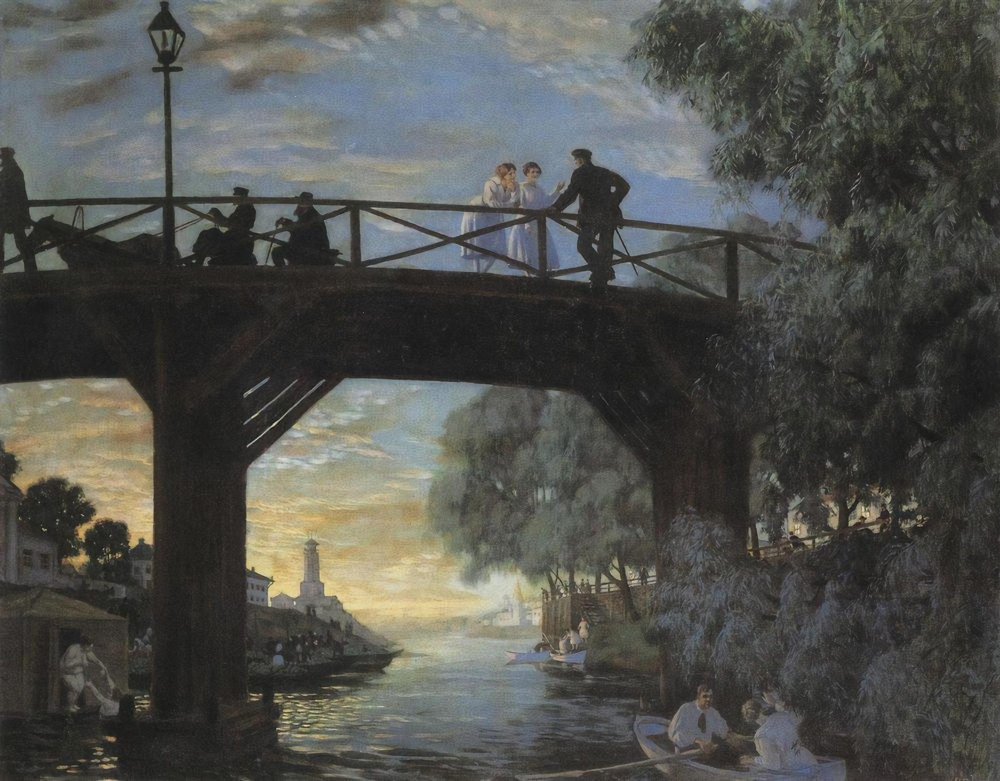

boris-kustodiev_bridge-astrakhan-1918.jpg
Prediction Caption: oyat delacroix


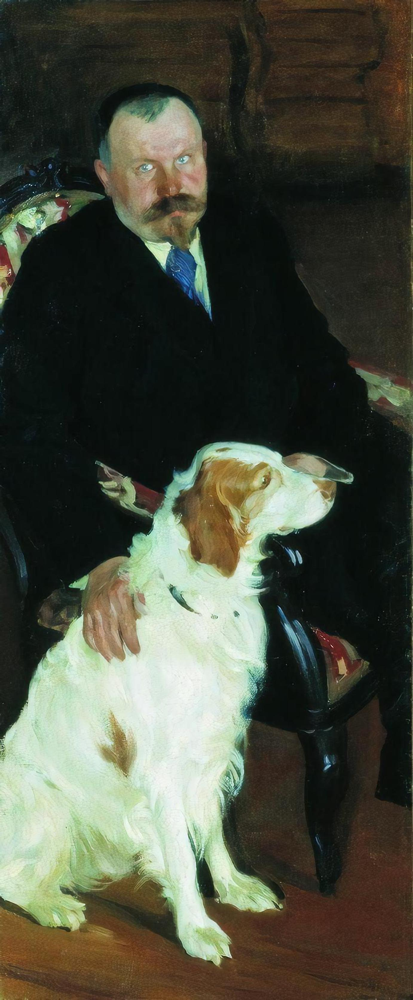

boris-kustodiev_portrait-of-dr-s-y-lyubimov-with-dog-1905.jpg
Prediction Caption: expulsion of venice venice the poet


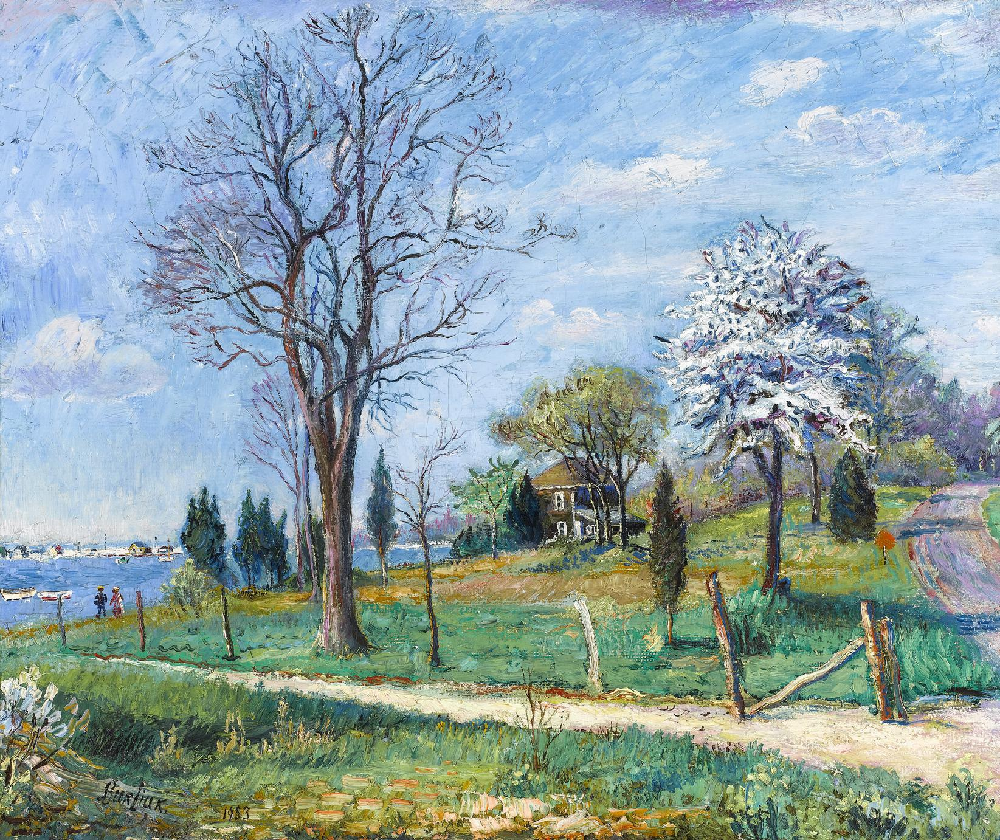

david-burliuk_a-lakeshore-1953.jpg
Prediction Caption: still life


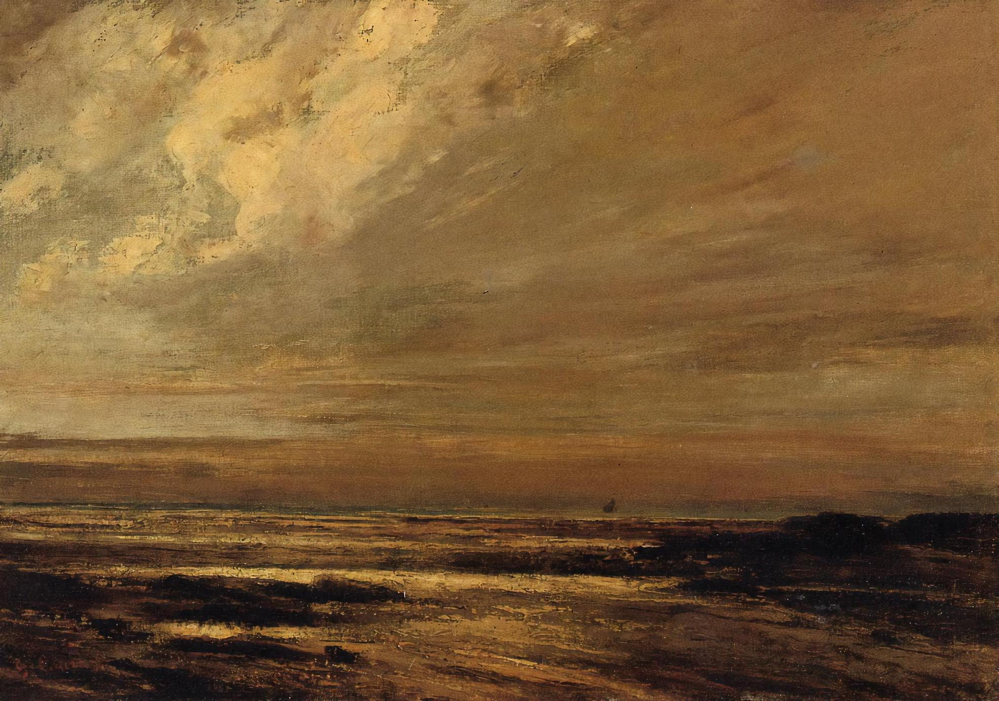

gustave-courbet_the-beach-at-trouville-at-low-tide-1865.jpg
Prediction Caption: lyme detail


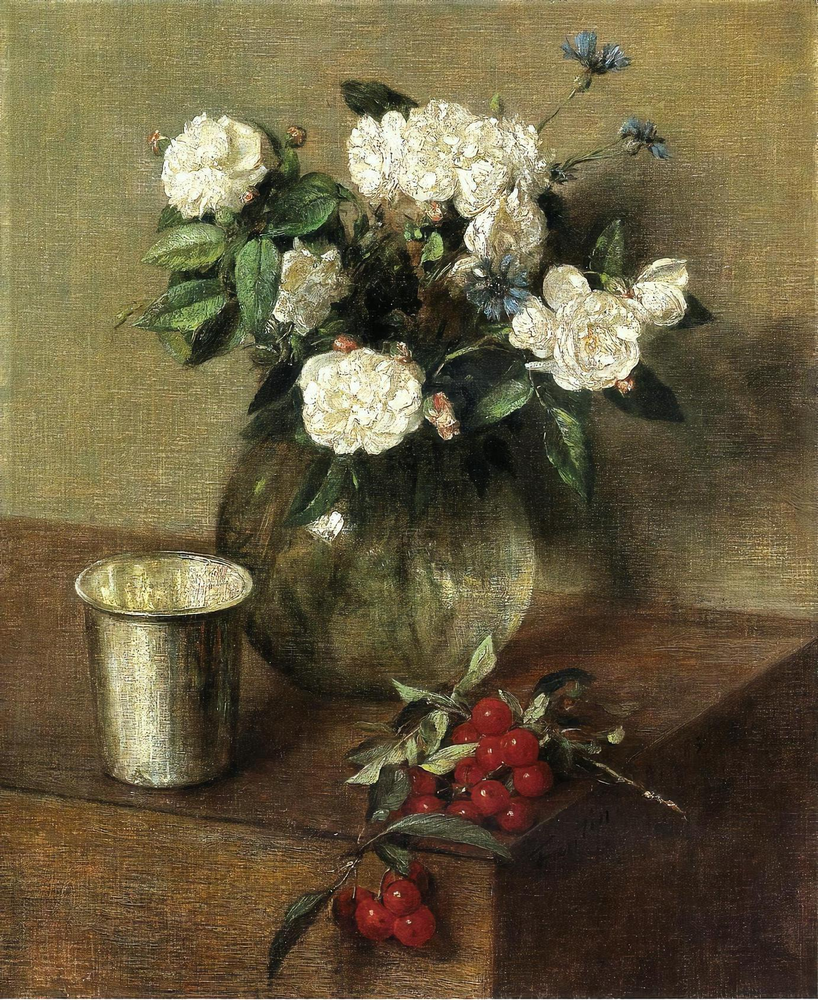

henri-fantin-latour_white-roses-and-cherries-1865.jpg
Prediction Caption: a promenade on the dragon a peasant


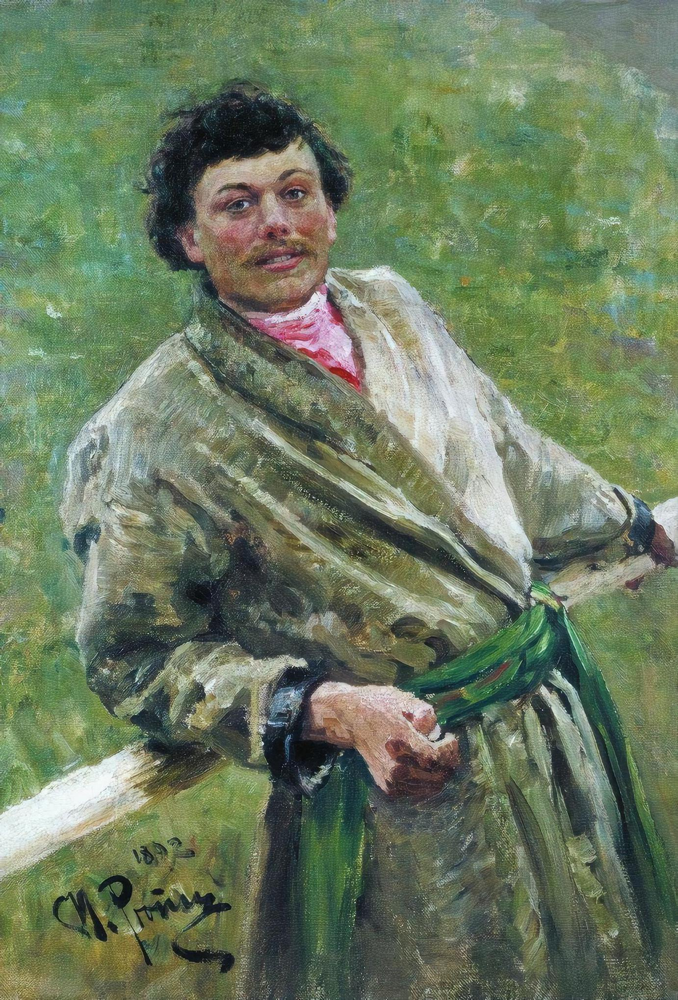

ilya-repin_portrait-of-sidor-shavrov-1892.jpg
Prediction Caption: view of pontoise


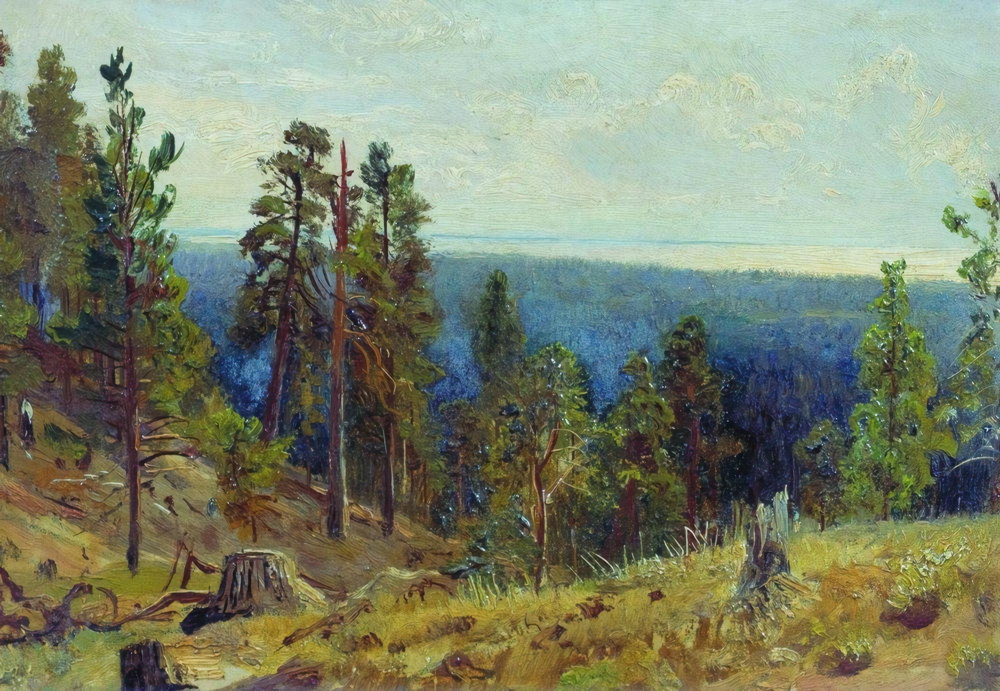

ivan-shishkin_forest-horizont.jpg
Prediction Caption: snow by a profile of debussy


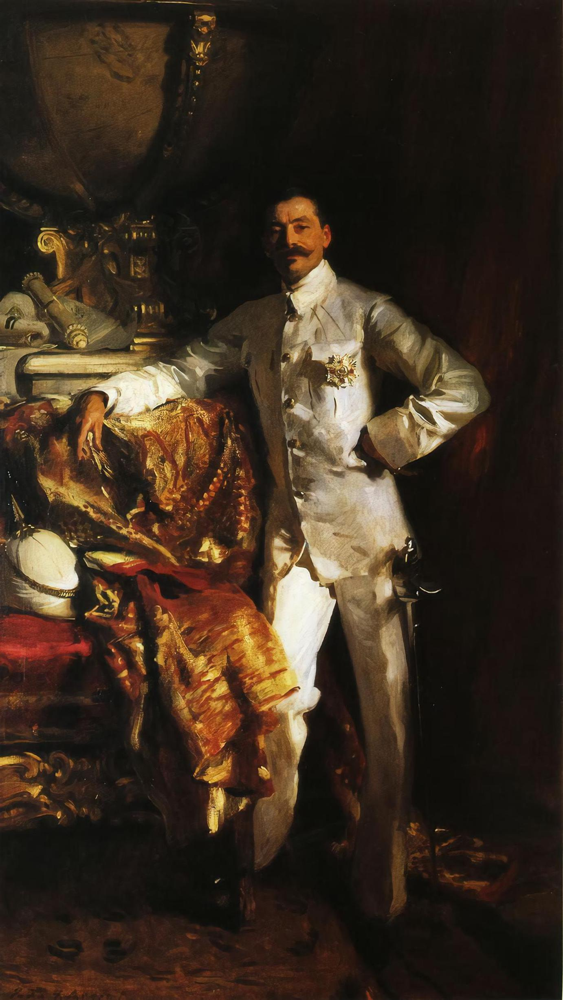

john-singer-sargent_sir-frank-swettenham-1904.jpg
Prediction Caption: portrait of isabella de montejasi slaying the village to the sophia


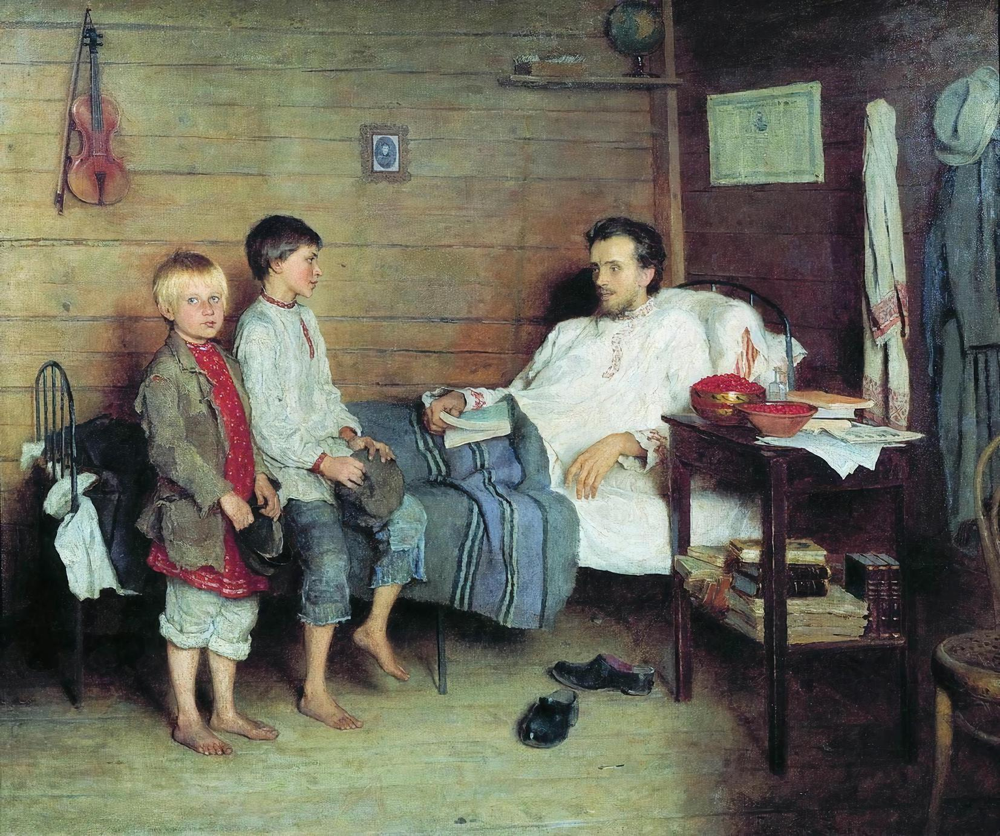

nikolay-bogdanov-belsky_visit-of-the-unhealthy-teacher.jpg
Prediction Caption: landscape with rainy day


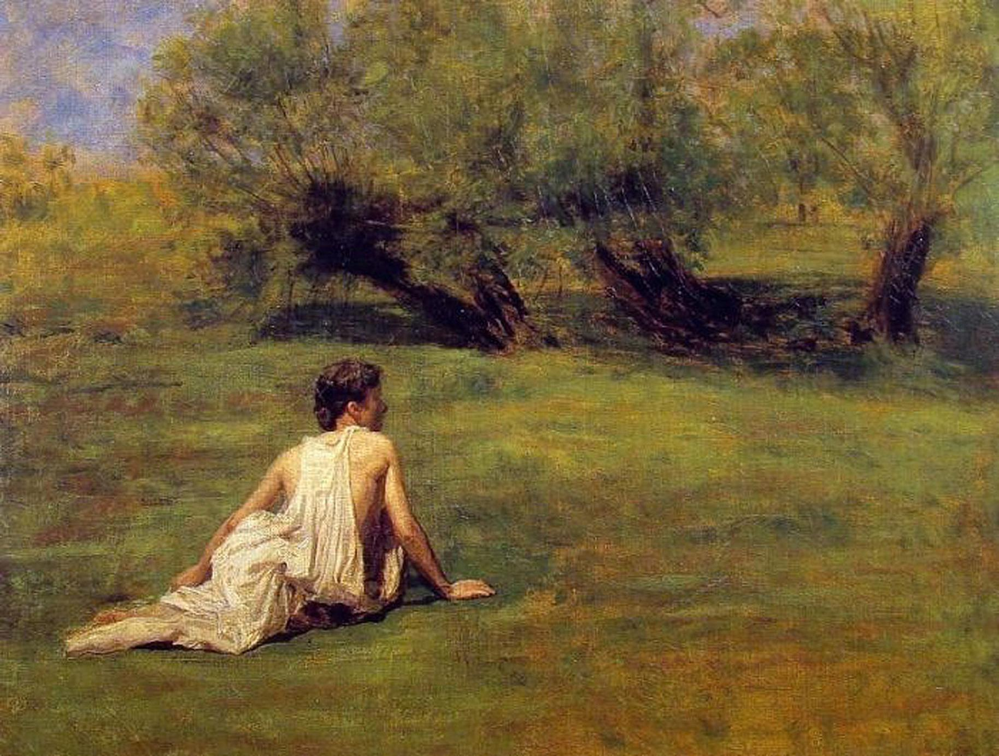

thomas-eakins_an-arcadian.jpg
Prediction Caption: sawyers with princess k i and snow


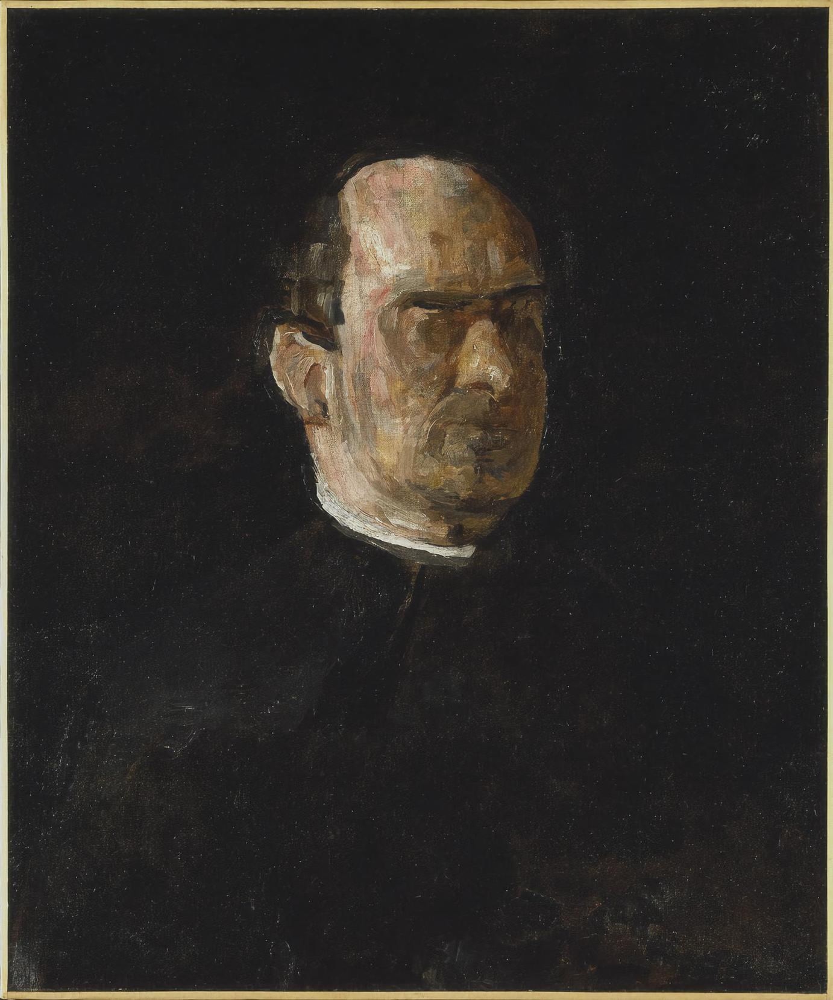

thomas-eakins_portrait-of-dr-edward-anthony-spitzka.jpg
Prediction Caption: charlotte route to the elders


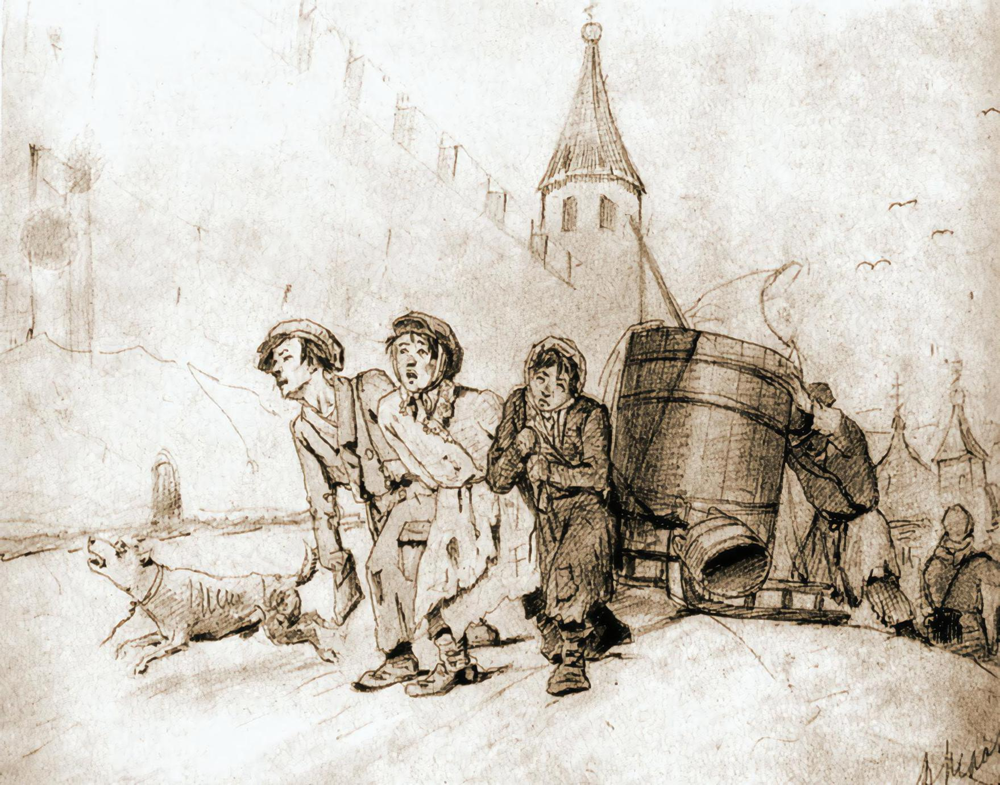

vasily-perov_triple-1865.jpg
Prediction Caption: trinity at wales


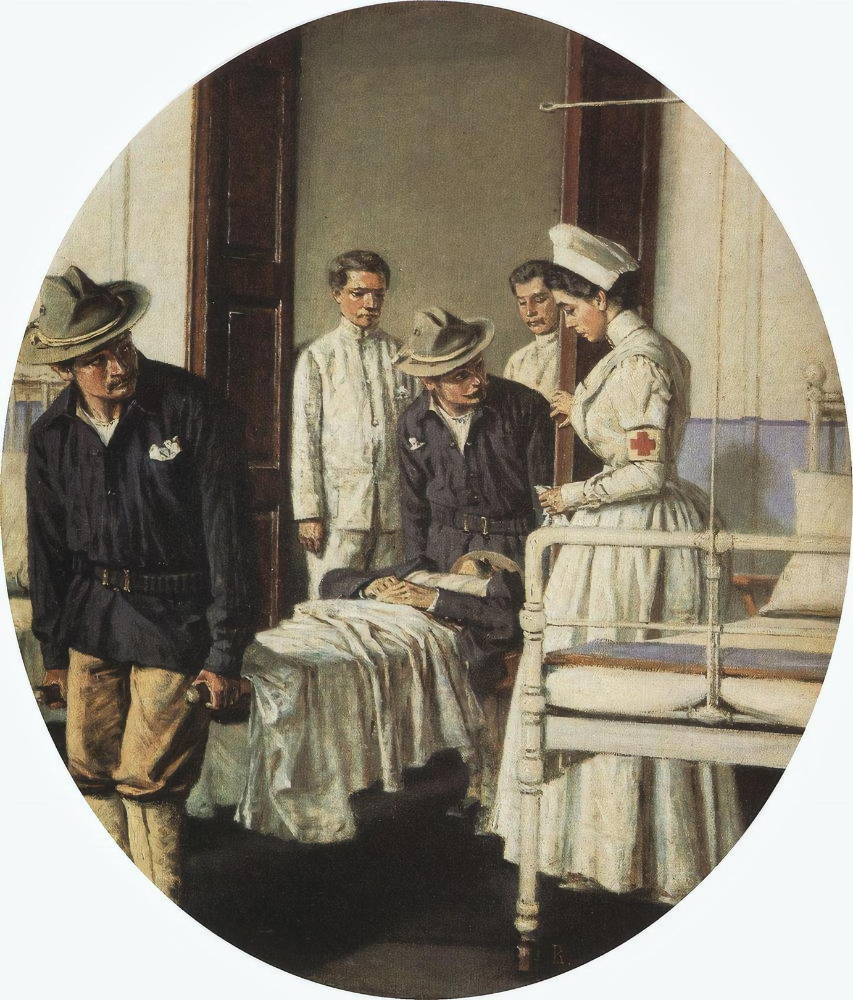

vasily-vereshchagin_in-the-hospital-1901.jpg
Prediction Caption: the lorrain schooner detail


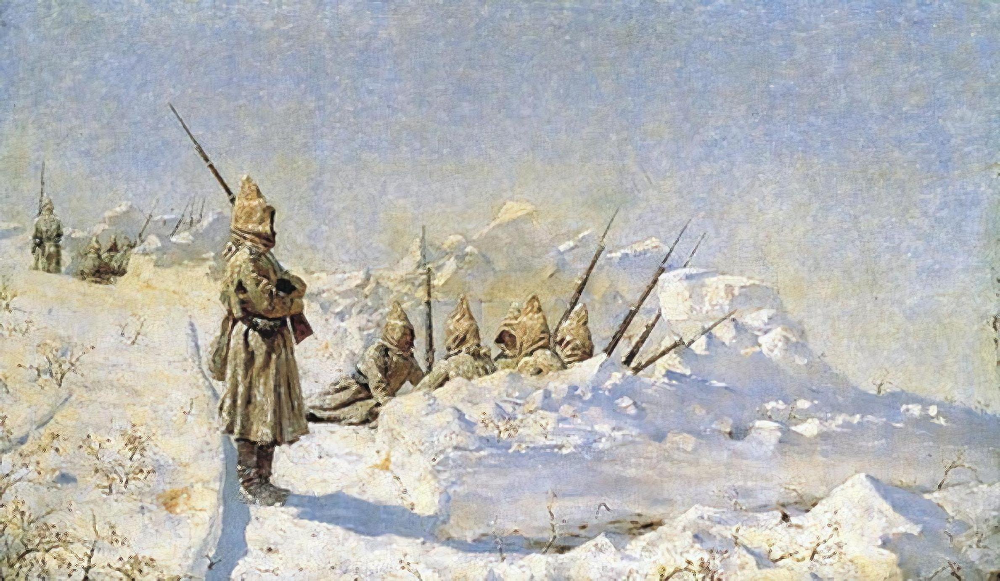

vasily-vereshchagin_snowy-trenches-russian-position-on-the-shipka-pass-1881.jpg
Prediction Caption: blue woman barge en armchair


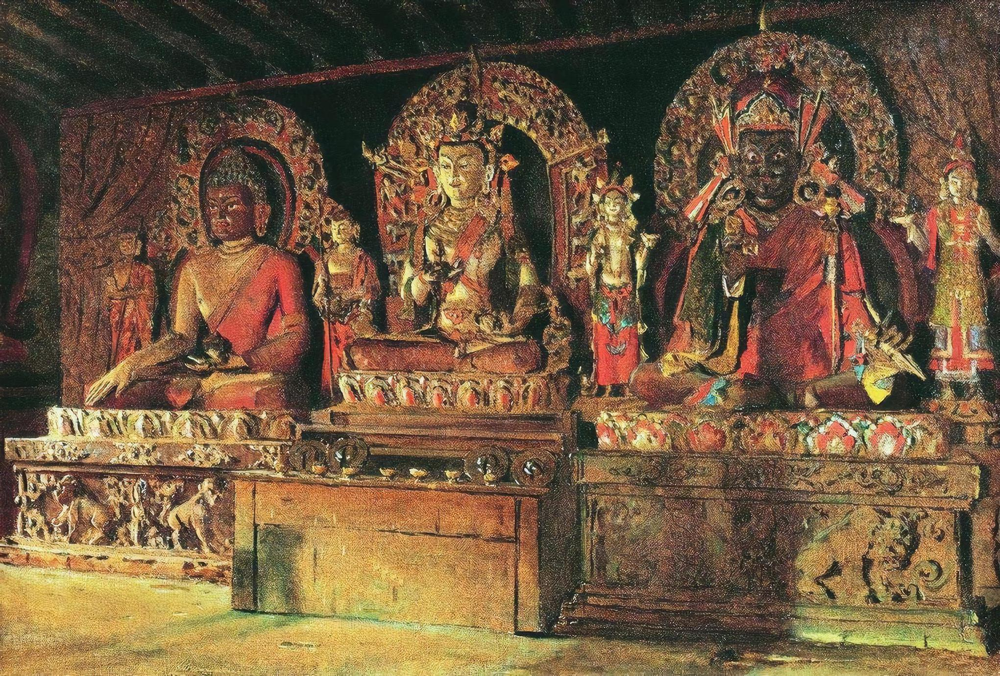

vasily-vereshchagin_the-three-main-gods-in-a-chingacheling-buddhist-monastery-in-sikkim-1875.jpg
Prediction Caption: portrait of born


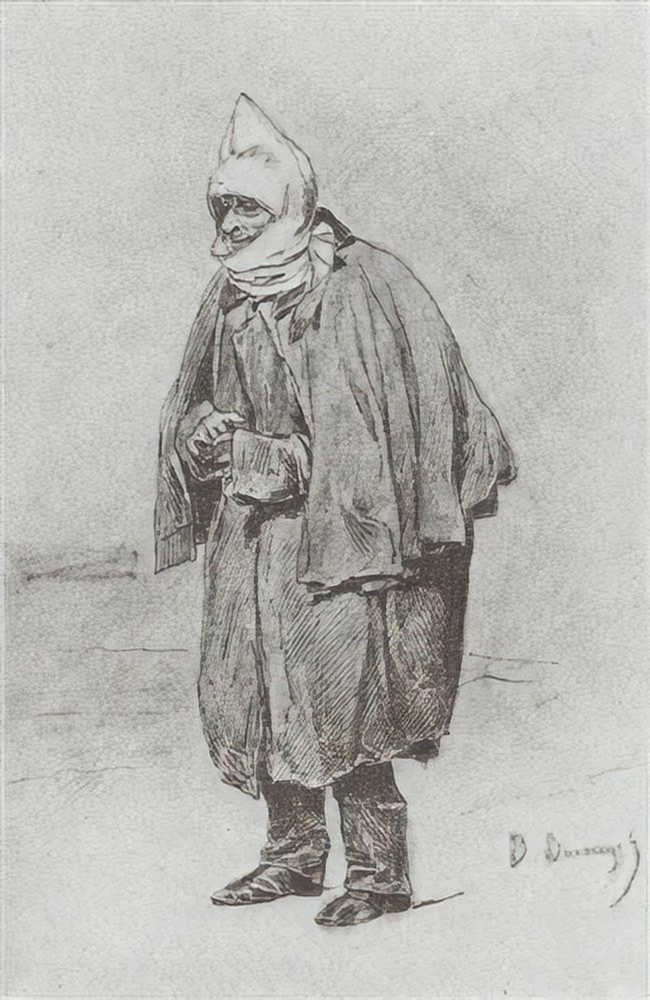

viktor-vasnetsov_pharmacist-1871.jpg
Prediction Caption: portrait of a russian schoolmaster


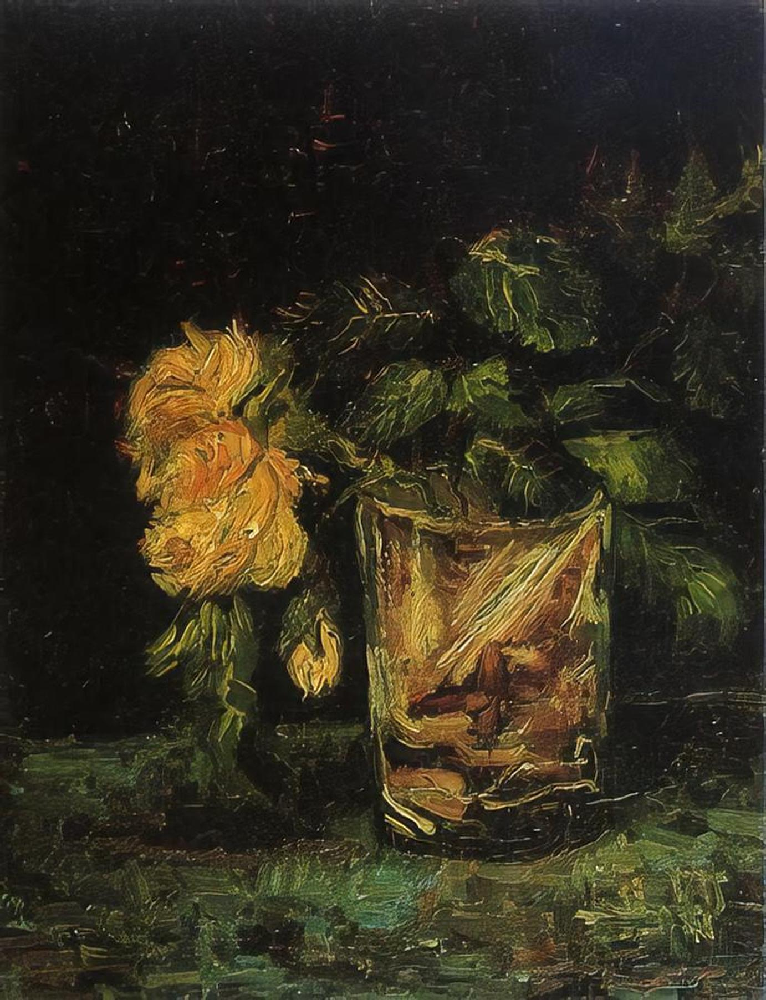

vincent-van-gogh_glass-with-roses-1886(1).jpg
Prediction Caption: spring in the isle l weather


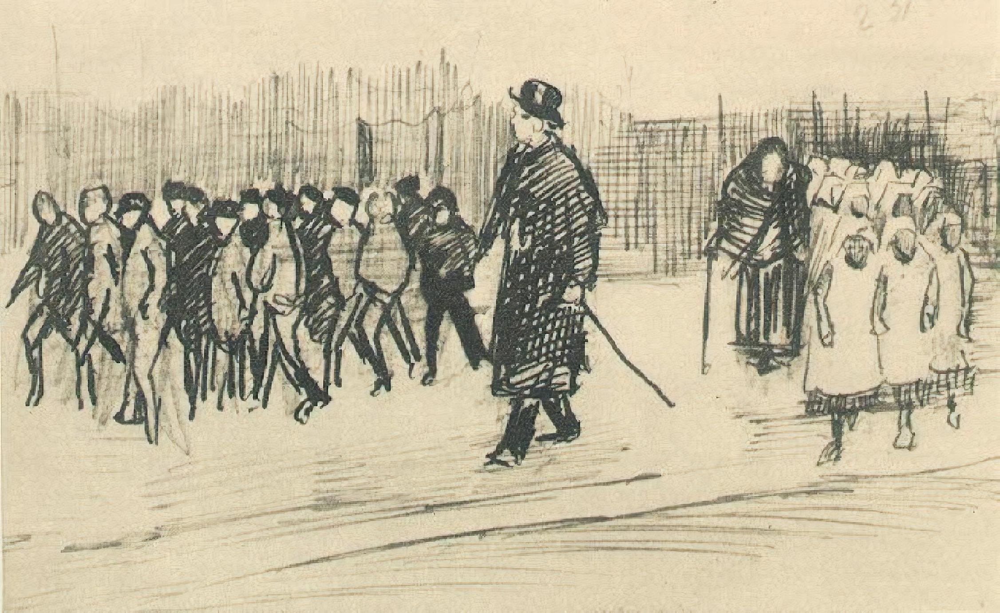

vincent-van-gogh_orphans-1882.jpg
Prediction Caption: big biracial from the baptistry against leningrad lake lukomskaya


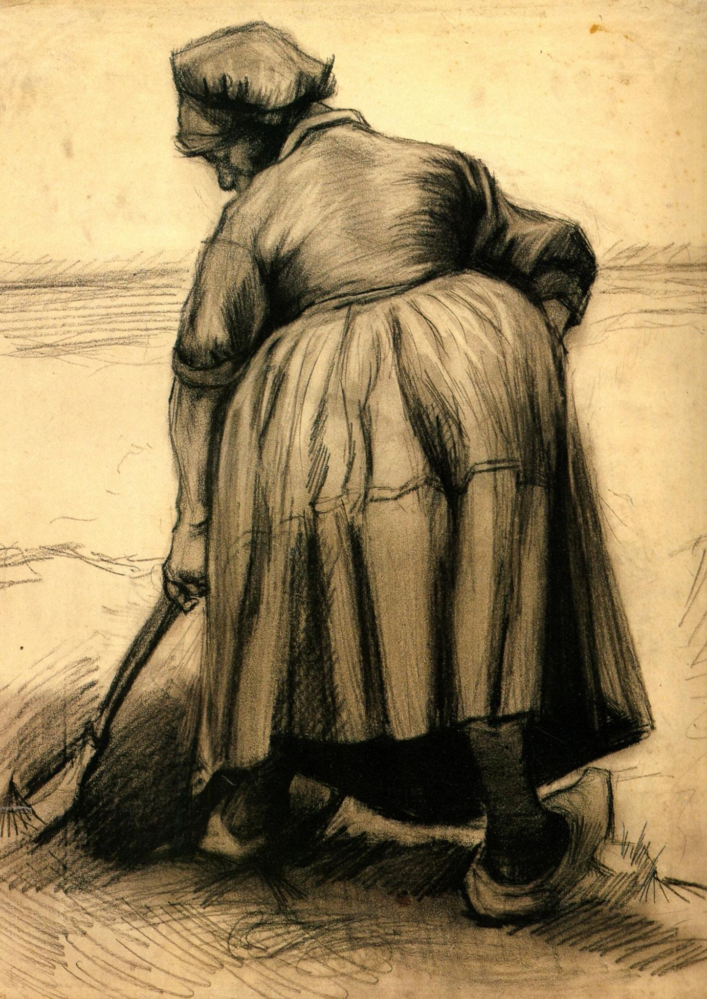

vincent-van-gogh_peasant-woman-digging-1885.jpg
Prediction Caption: self portrait


In [11]:
# тестирование
test_images = os.listdir('/content/drive/MyDrive/paintings/wikiart/test/attention_test/') # вставить путь к папке с тестовыми изображениями
# print(test_images)
image_model = InceptionResNetV2(include_top='False', weights='imagenet')

new_input = image_model.input
hidden_layer = image_model.layers[-3].output
# print(hidden_layer.shape)

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)
# image_features_extract_model.summary()
from IPython.display import Image, display
for rid in range(len(test_images)):
  image = test_images[rid]
  display(Image('/content/drive/MyDrive/paintings/wikiart/test/attention_test/{}'.format(image), width=300, height=300)) # вставить путь к папке с тестовыми изображениями
  image_path = '/content/drive/MyDrive/paintings/wikiart/test/attention_test/{}'.format(image) # вставить путь к папке с тестовыми изображениями
  print(image)
  result, attention_plot = evaluate(image_path)
  print ('Prediction Caption:', ' '.join(result[:-1]))

In [ ]:
# bleu evaluation on test set

bleu1 = 0
bleu2 = 0
bleu3 = 0
bleu4 = 0
length = len(test)
for name in test:
  reference = old_test_descriptions[name][0].split()[1:-1]
  # print(name)
  feature = np.load('/content/drive/MyDrive/paintings123/single_features/{}.npy'.format(filenames[name]))[0] # вставить путь к папке с фичами
  result = evaluate_with_feature(feature)
  hyp = result[:-1]
  score1 = sentence_bleu([reference], hyp, weights=(1, 0, 0, 0))
  score2 = sentence_bleu([reference], hyp, weights=(0.5, 0.5, 0, 0))
  score3 = sentence_bleu([reference], hyp, weights=(0.33, 0.33, 0.33, 0.33))
  score4 = sentence_bleu([reference], hyp, weights=(0.25, 0.25, 0.25, 0.25))
  bleu1 += score1
  bleu2 += score2
  bleu3 += score3
  bleu4 += score4
  print ('Real Caption:', reference)
  print ('Prediction Caption:', ' '.join(result[:-1]), 'bleu: ', score1, score2, score3, score4, sep=' ')
average1 = bleu1 / length
average2 = bleu2 / length
average3 = bleu3 / length
average4 = bleu4 / length
print(average1, average2, average3, average4, sep=' ')